# Face detection on masked images

Notebook to test the MTCNN face detector on images of people wearing masks.

In [1]:
from pathlib import Path
from mtcnn.mtcnn import MTCNN

import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

Using TensorFlow backend.


### Setup 

In [2]:
# file with URLs to images
people_with_masks_fn = 'people_with_masks' 

data_dir = Path('data')
raw_dir = data_dir / 'raw'
staging_dir = data_dir / 'staging'

# path were files will be downloaded
masked_face_dir = raw_dir / 'masked_face_images'
masked_face_dir.mkdir(exist_ok=True)

# path were cropped faces will be stored
cropped_faces_dir = staging_dir / 'cropped_faces'
cropped_faces_dir.mkdir(exist_ok=True)

### Download images from URL file

In [3]:
opener=urllib.request.build_opener()
# the opener is needed to avoid 403 from pexels
opener.addheaders=[('User-Agent','Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/36.0.1941.0 Safari/537.36')]
urllib.request.install_opener(opener)

with open(people_with_masks_fn) as fp:
    for idx, line in enumerate(fp):
        try:
            urllib.request.urlretrieve(line, str(masked_face_dir / (str(idx) + '.jpg')))
        except:
            print(f"skipping {line}")

### Detect faces

0


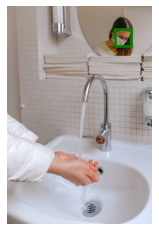

1


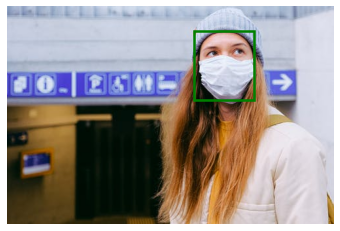

2


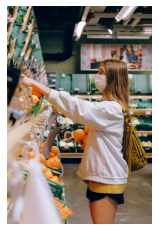

3


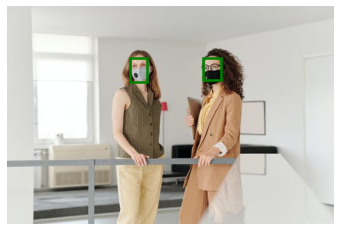

4


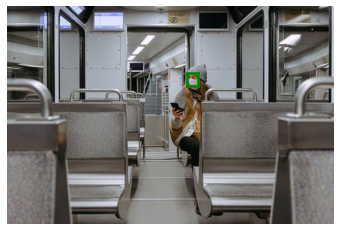

5


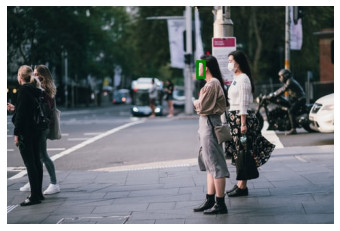

6


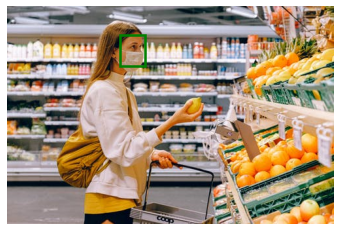

7


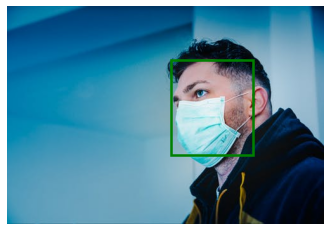

8


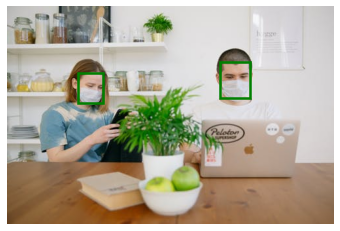

9


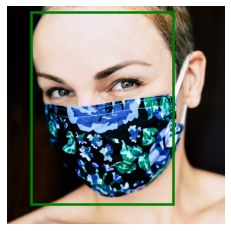

10


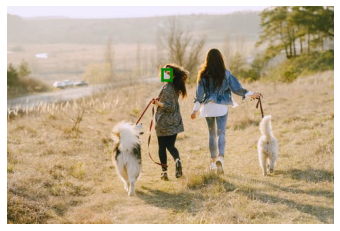

11


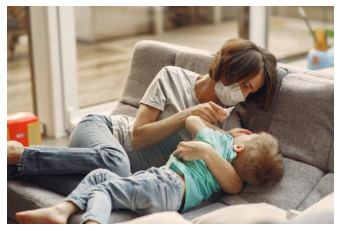

12


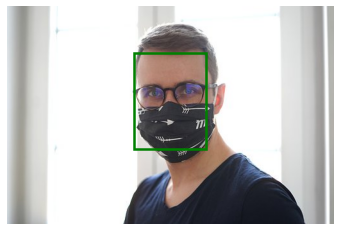

13


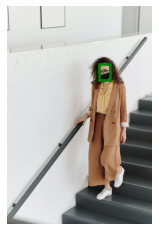

14


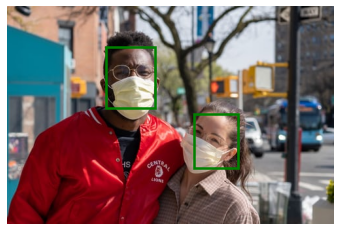

15


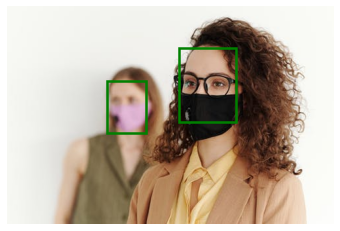

16


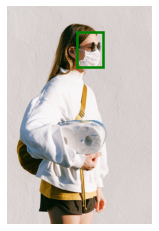

17


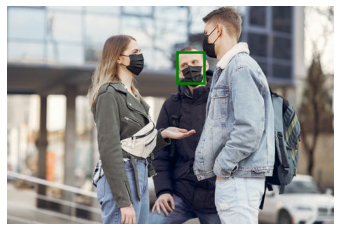

18


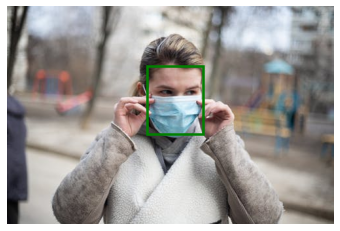

19


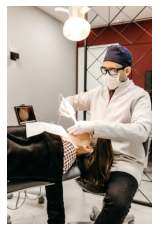

20


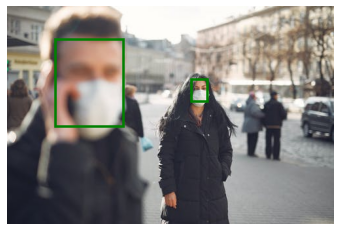

21


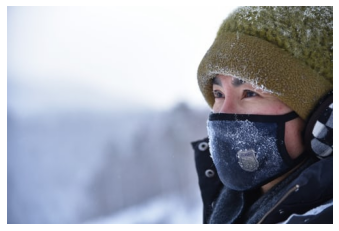

22


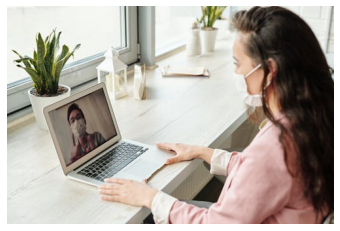

23


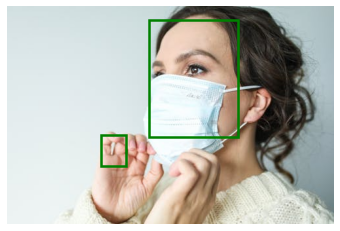

24
Detector extracted a face with 0 rows or columns, skipping this one for data/raw/masked_face_images/125.jpg


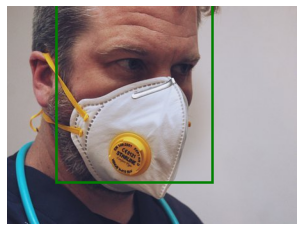

25


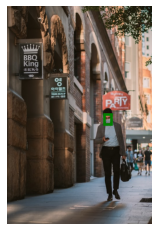

26


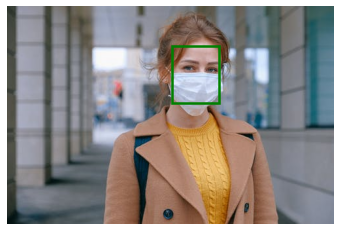

27


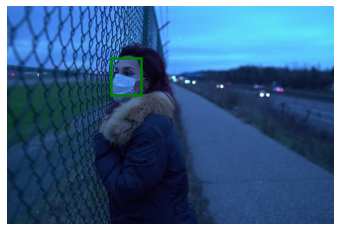

28


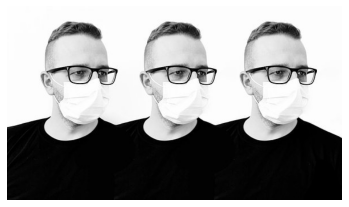

29


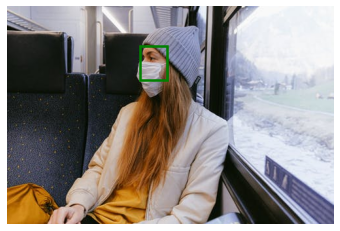

30


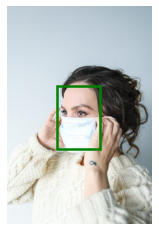

31


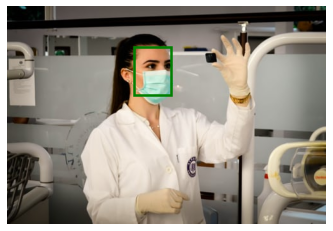

32
Detector extracted a face with 0 rows or columns, skipping this one for data/raw/masked_face_images/117.jpg


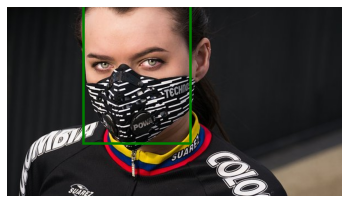

33


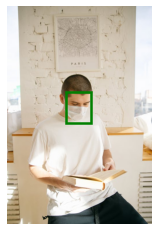

34


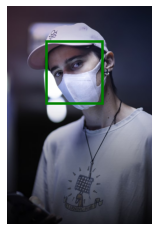

35


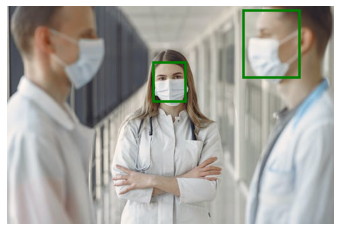

36


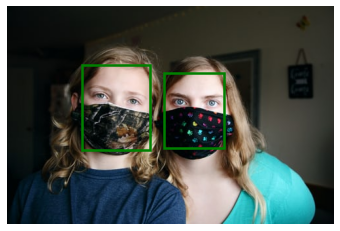

37


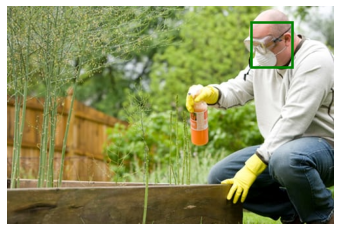

38


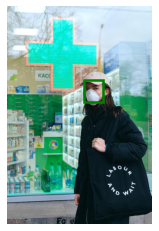

39


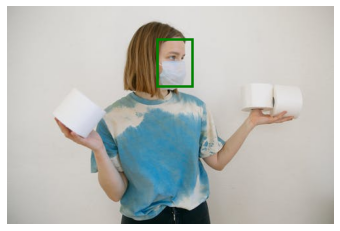

40


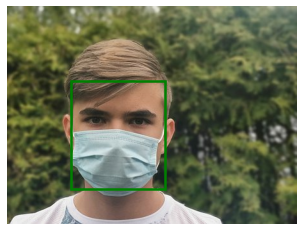

41


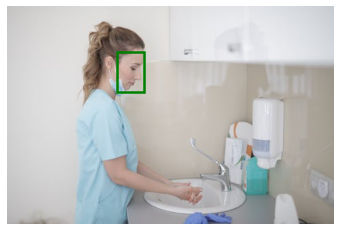

42


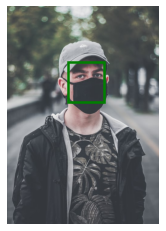

43


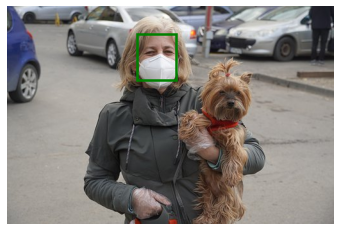

44


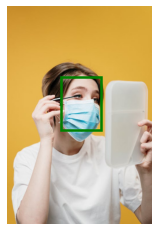

45


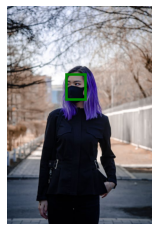

46


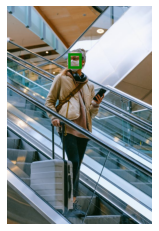

47


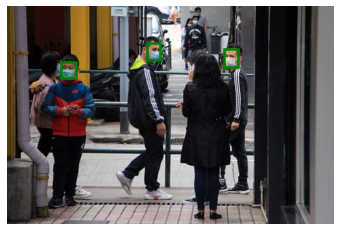

48


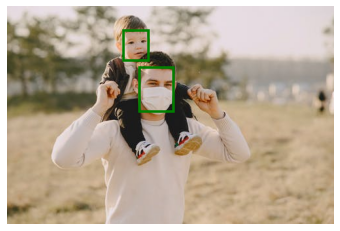

49


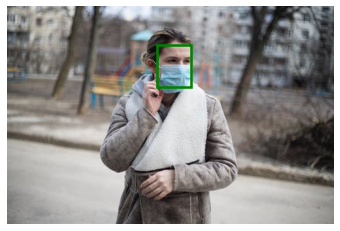

50


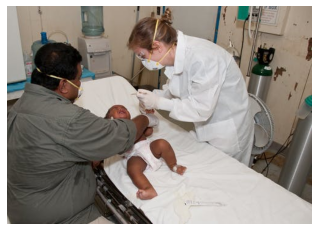

51


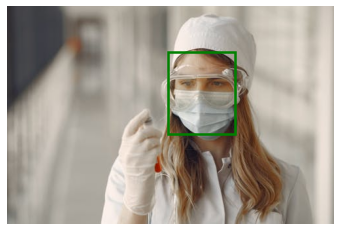

52


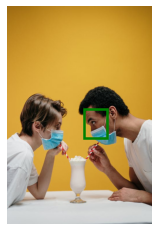

53


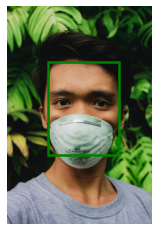

54


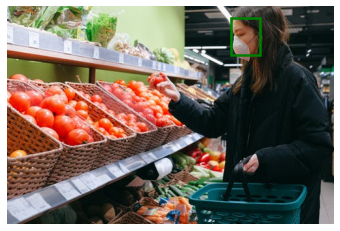

55
Detector extracted a face with 0 rows or columns, skipping this one for data/raw/masked_face_images/115.jpg


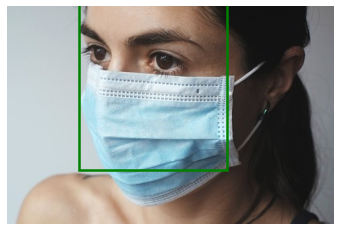

56


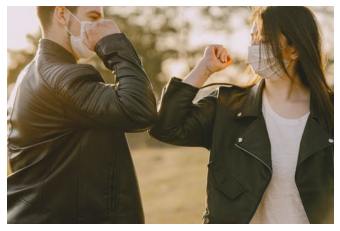

57


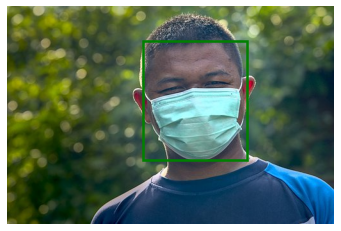

58


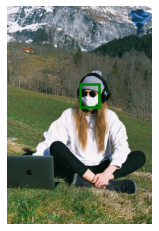

59


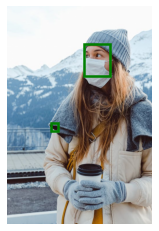

60


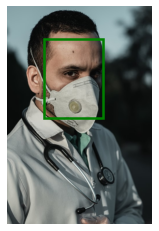

61


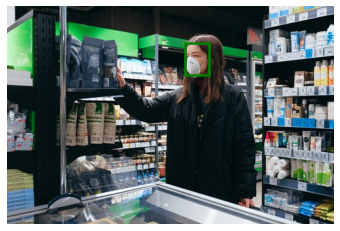

62


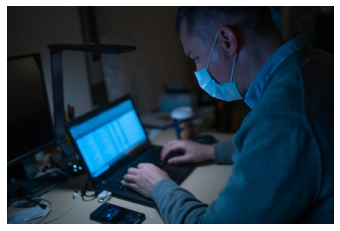

63


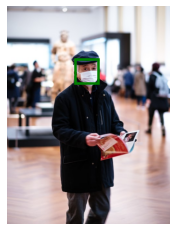

64


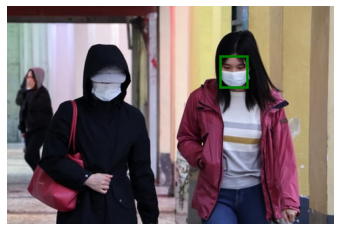

65


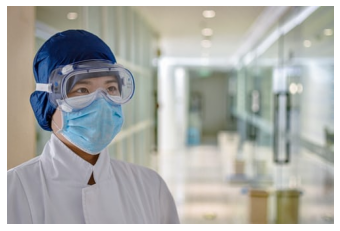

66


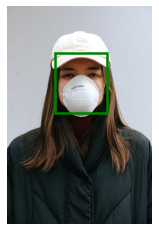

67


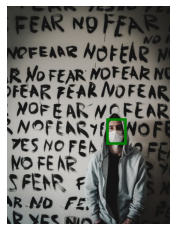

68


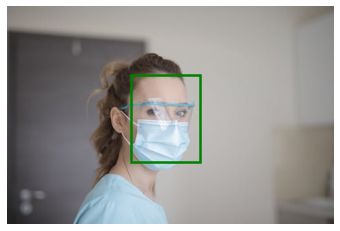

69


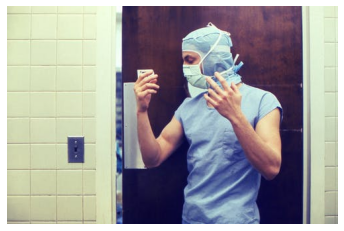

70


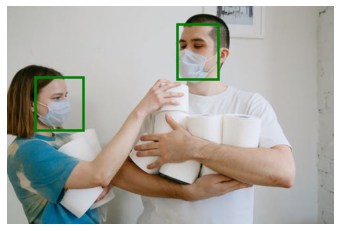

71


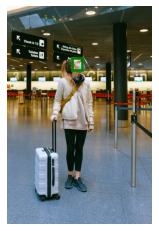

72


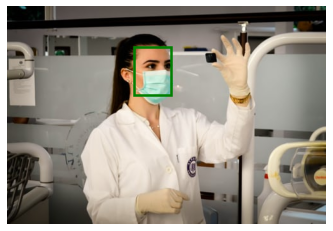

73


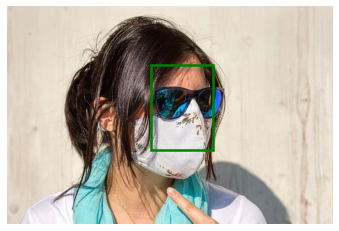

74


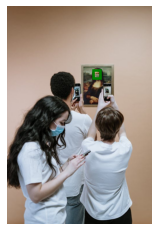

75


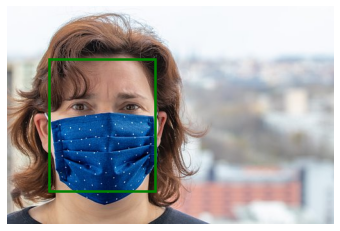

76


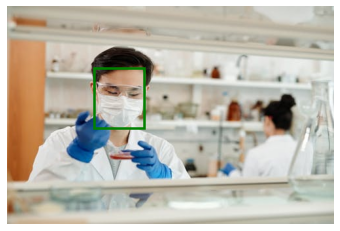

77


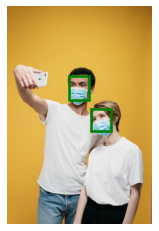

78


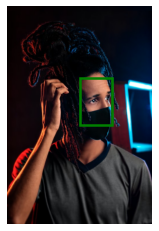

79


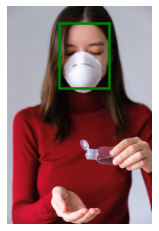

80


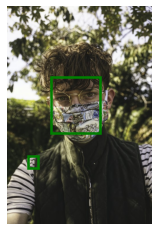

81


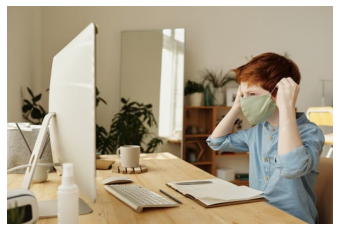

82


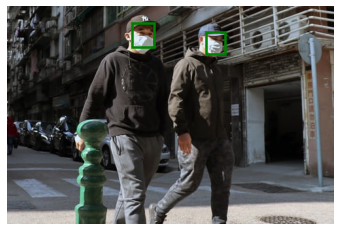

83


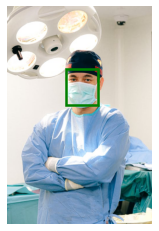

84


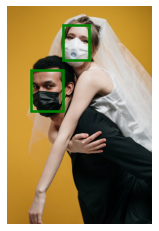

85


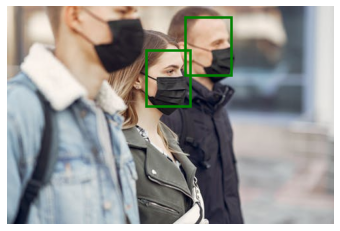

86


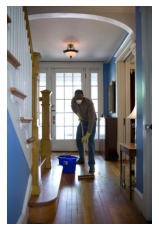

87


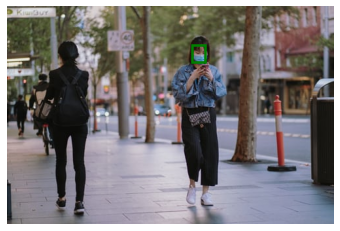

88


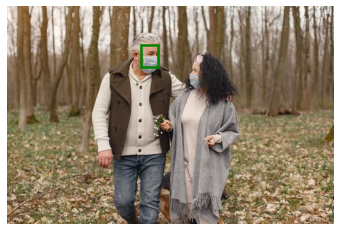

89
Detector extracted a face with 0 rows or columns, skipping this one for data/raw/masked_face_images/48.jpg


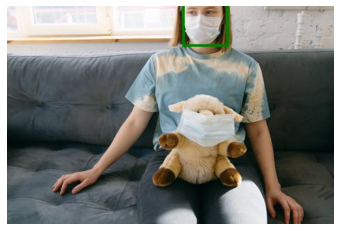

90


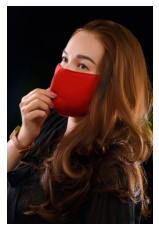

91


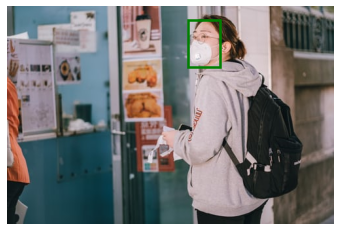

92


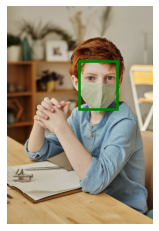

93


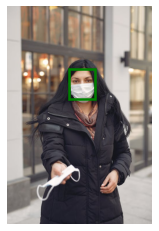

94


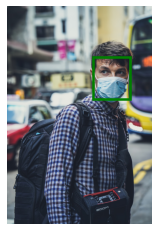

95


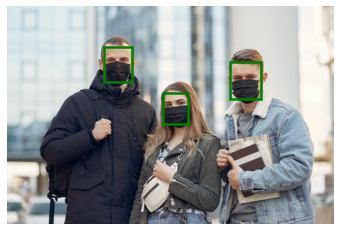

96


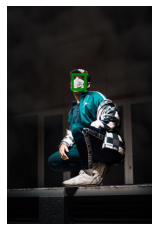

97


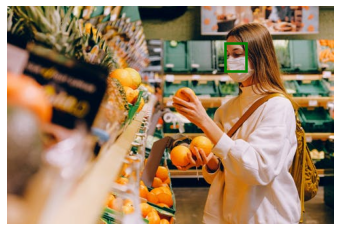

98


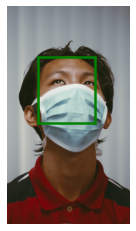

99


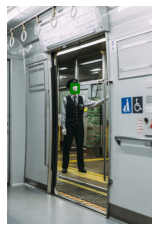

100


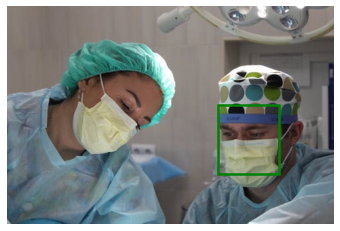

101


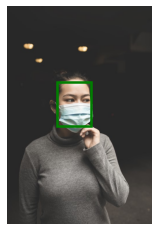

102


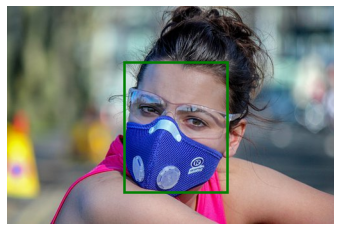

103


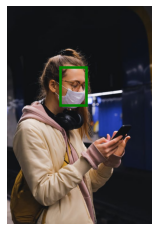

104


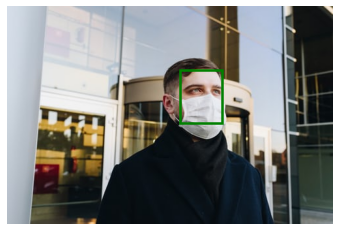

105


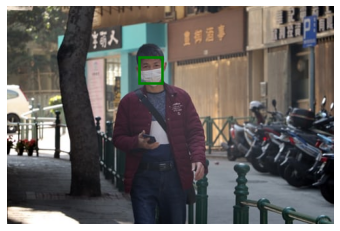

106


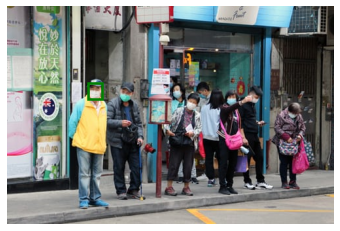

107


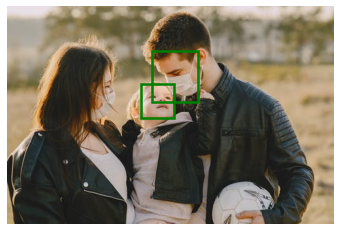

108


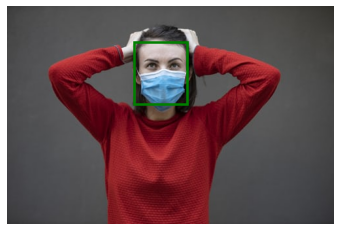

109


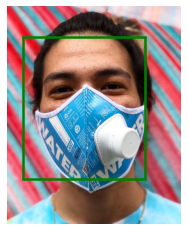

110


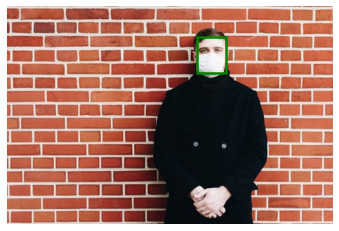

111


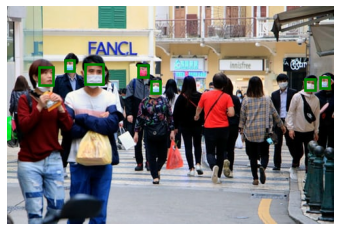

112


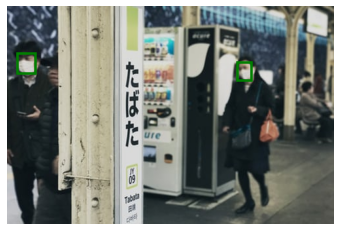

113


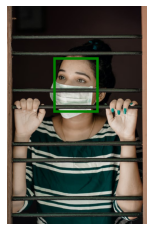

114


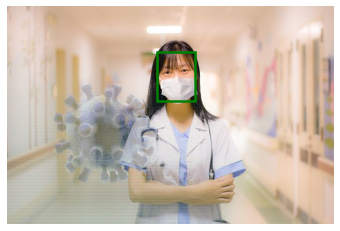

115


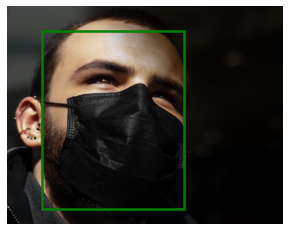

116


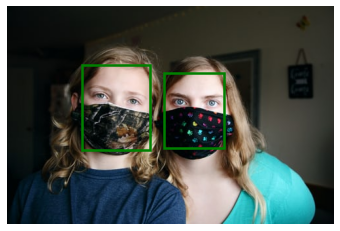

117


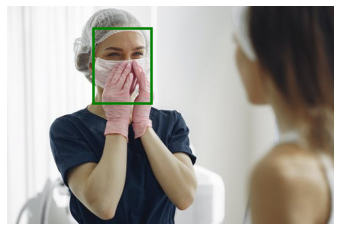

118


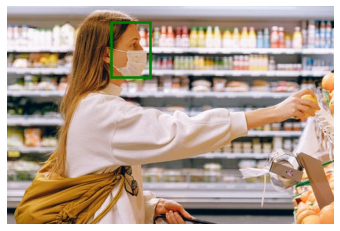

119


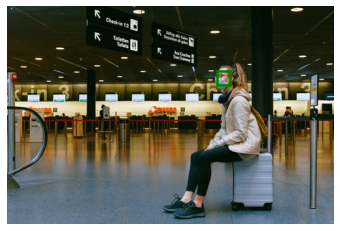

120


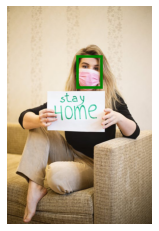

121


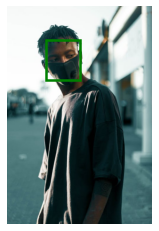

122


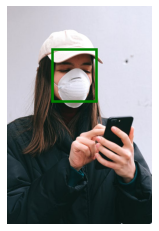

123


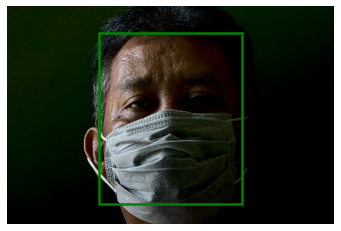

124


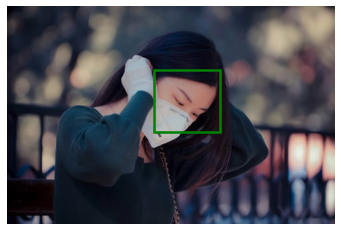

125


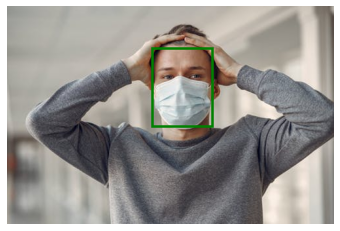

126


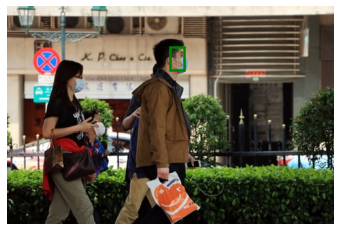

127


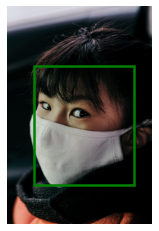

In [4]:
detector = MTCNN(step_thresholds=[0])

for idx, fn in enumerate(masked_face_dir.glob('*.jpg')):
    print(idx)
    img = cv2.imread(str(fn))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure()
    plt.imshow(img)

    faces = detector.detect_faces(img)
    for face_idx, face in enumerate(faces):
        x = face['box'][0]
        y = face['box'][1]
        w = face['box'][2]
        h = face['box'][3]
        rect = plt.Rectangle((x, y),
                                  w,
                                  h, fill=False,
                                  edgecolor='green', linewidth=2.5)
        plt.gca().add_patch(rect)
        
        cropped_face = img[y:y+h, x:x+w]
        output_fn = cropped_faces_dir / (fn.stem + '_' + str(face_idx) + '.jpg')
        
        if cropped_face.shape[0] == 0 or cropped_face.shape[1] == 0:
            print(f"Detector extracted a face with 0 rows or columns, skipping this one for {fn}")
            continue
        
        cv2.imwrite(str(output_fn), cv2.cvtColor(cropped_face, cv2.COLOR_RGB2BGR))
       
    plt.axis('off')
    plt.show()  
    
    
    